# Comparison algorithm

## Imports and functions

In [1]:
%load_ext autoreload
%autoreload 2

# Standard imports
from collections import defaultdict
import csv
import pickle 
import time

# 3rd party imports
import numpy as np
np.set_printoptions(linewidth=1000)
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from pprint import pprint
from tqdm.notebook import tqdm

# Local imports
import modules.laplacian as laplacian
import modules.jacobian as jacobian

In [2]:
def points_in_grid(points, center, grid_size=7):
    """
    Get the indexes of the points that lie within a grid centered at the center point.
    
    Args:
    - points (np.array): The points to filter
    - center (tuple): The center of the grid
    - grid_size (int): The size of the grid
    
    Returns:
    - np.array: The indexes of the points that lie within the grid
    """
    cz, cy, cx = center
    radius = grid_size // 2  # 3 for a 7x7 grid
    
    # Filtering points that lie within the 7x7 boundary
    filtered_indexes = [
        i for i, (z, y, x) in enumerate(points)
        if (cx - radius) <= x <= (cx + radius) and (cy - radius) <= y <= (cy + radius) and not np.array_equal(center, [z, y, x])
    ]
    
    return np.array(filtered_indexes)


def plot_points(center_mpoint, center_fpoint, mpoints, fpoints, jdet_field, grid_size=7):
    center_magnitude = np.linalg.norm(center_mpoint - center_fpoint)
    print(f"Center point magnitude: {center_magnitude:.2f}")
    
    filtered_indexes = points_in_grid(mpoints, center_mpoint, grid_size)
    filtered_mpoints = mpoints[filtered_indexes]
    filtered_fpoints = fpoints[filtered_indexes]
    
    plt.figure(figsize=(8, 8))
    
    norm = mcolors.TwoSlopeNorm(vmin=jdet_field.min(), vcenter=0, vmax=jdet_field.max())
    plt.imshow(jdet_field, cmap='seismic', norm=norm)
    plt.colorbar()
    
    plt.scatter(filtered_mpoints[:, 2], filtered_mpoints[:, 1], c='blue', label='Moving points')
    plt.scatter(filtered_fpoints[:, 2], filtered_fpoints[:, 1], c='green', label='Fixed points')
    
    # Draw arrows between corresponding points
    for m_point, f_point in zip(filtered_mpoints, filtered_fpoints):
        plt.arrow(m_point[2], m_point[1], f_point[2] - m_point[2], f_point[1] - m_point[1],
                  head_width=0.3, head_length=0.3, fc='black', ec='black')

    
    plt.scatter(center_mpoint[2], center_mpoint[1], c='red', label='Center point')
    plt.scatter(center_fpoint[2], center_fpoint[1], c='orange', label='Center point correspondence')
    plt.arrow(center_mpoint[2], center_mpoint[1], center_fpoint[2] - center_mpoint[2], center_fpoint[1] - center_mpoint[1],
              head_width=0.3, head_length=0.3, fc='black', ec='black')
    
    plt.xlim(center_mpoint[2] - grid_size // 2, center_mpoint[2] + grid_size // 2)
    plt.ylim(center_mpoint[1] - grid_size // 2, center_mpoint[1] + grid_size // 2)
    
    # Reverse y axis
    plt.gca().invert_yaxis()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.grid(True)
    #plt.legend()
    plt.show()

### Data class

In [3]:
import networkx as nx

class Data:
    def __init__(self, mpoints: np.ndarray, fpoints: np.ndarray, resolution: np.ndarray, lut=None):
        """Initialize the Data object with matched points and resolution.
        
        Args:
            mpoints (np.ndarray): Matched points in the model image.
            fpoints (np.ndarray): Corresponding points in the frame image.
            resolution (np.ndarray): Resolution of the image (y, x)
        """
        self.mpoints = mpoints
        self.fpoints = fpoints
        self.resolution = resolution
        self.deformation, self.jdet_field = self._create_grid()
        if type(lut) == str:
            self.lut = np.load(lut)
        else:
            self.lut = lut

        
    def _create_grid(self):
        """Create a grid of correspondences between matched points.

        Args:
            mpoints (np.ndarray): Matched points in the model image.
            fpoints (np.ndarray): Corresponding points in the frame image.
            
        Returns:
            np.ndarray: Deformation field.
            np.ndarray: Jacobian determinant field.
        """
        # Run Laplacian and Jacobian determinant calculations and save the Jacobian determinant field
        grid_resolution = np.zeros((1, self.resolution[0], self.resolution[1]))
        deformation, _, _, _, _ = laplacian.sliceToSlice3DLaplacian(grid_resolution, self.mpoints, self.fpoints)
        jdet_field = jacobian.sitk_jacobian_determinant(deformation)[0]
        return deformation, jdet_field
        
        
    def compare(self, idx1: int, idx2: int, grid_size=None, title=None, figsize=(10, 5), 
                fontsize=6, show=True, show_text=False, show_axis=False):
        """Compare two correspondences in the grid.
        
        Args:
            idx1 (int): Index of the first point.
            idx2 (int): Index of the second point.
            
        Returns:
            Data: New Data object with only the two correspondences compared.
        """
        mpoint1 = self.mpoints[idx1].copy()
        fpoint1 = self.fpoints[idx1].copy()
        mpoint2 = self.mpoints[idx2].copy()
        fpoint2 = self.fpoints[idx2].copy()
        
        if grid_size is not None:
            center = grid_size // 2
            center_array = np.array([0, center, center])
            #center_diff = center_array - mpoint1
            center_diff = center_array - fpoint1
            
            # Move points to center of grid
            mpoint1 += center_diff
            fpoint1 += center_diff
            mpoint2 += center_diff
            fpoint2 += center_diff

        mpoints = np.vstack((mpoint1, mpoint2))
        fpoints = np.vstack((fpoint1, fpoint2))
        
        if grid_size is None:
            d = Data(mpoints, fpoints, self.resolution)
        else:
            d = Data(mpoints, fpoints, (grid_size, grid_size))
            
        if show:
            if title is None:
                title = f"Comparing {idx1} and {idx2}, min = {d.min():.2f}"
            d.show(title=title, figsize=figsize, fontsize=fontsize, show_text=show_text, show_axis=show_axis)
        return d
    
    
    def min(self):
        """Find the minimum Jacobian determinant value in the grid.
        
        Returns:
            float: Minimum Jacobian determinant value.
        """
        return np.min(self.jdet_field)
    
    
    def count_negatives(self):
        """
        Counts the number of negative Jacobian determinants in the grid.
        
        Returns:
            int: Number of negative Jacobian determinants.
        """
        return np.sum(self.jdet_field <= 0)
    
    
    def get_negative_coordinates(self, show=True):
        """
        Get the coordinates of negative Jacobian determinants in the grid.
        
        Args:
            show (bool): Whether to print the coordinates of the negative Jacobian determinants.
            
        Returns:
            np.ndarray: Array of coordinates of negative Jacobian determinants.
        """
        # Get coordinate of negative Jacobian determinants
        negatives = np.argwhere(self.jdet_field <= 0)
        if show:
            print("Negative Jacobian determinants:")
            for y, x in negatives:
                print(f"({y}, {x})")
        return negatives
    
    
    def build_conflict_graph(self, threshold: float = 0.0, grid_size=101, 
                             show=True, fontsize=6, show_text=False, show_axis=False):
        """Build a conflict graph based on the Jacobian determinant field.
        
        Args:
            threshold (float, optional): Threshold for conflict detection. Defaults to 0.0.
            
        Returns:
            nx.Graph: Conflict graph where keys are indices of moving points and values are lists of conflicting indices.
        """
        conflict_graph = nx.Graph()
        scores = np.zeros(self.mpoints.shape[0])
        
        #scores = np.full(self.mpoints.shape[0], np.inf)
        
        # Check for conflicts between correspondence pairs
        num_correspondences = self.mpoints.shape[0]
        #for i in tqdm(range(num_correspondences)):
        for i in range(num_correspondences):
            
            # Filter points and compare only to nearby points
            current_point = self.fpoints[i]
            neighbor_indices = points_in_grid(self.fpoints, current_point, grid_size=grid_size)
            neighbor_indices = neighbor_indices[neighbor_indices >= i]
            
            #for j in tqdm(range(i + 1, num_correspondences), leave=False):
            #for nj in tqdm(range(len(neighbor_indices)), leave=False):
            for nj in range(len(neighbor_indices)):
                j = neighbor_indices[nj]
                d = self.compare(i, j, grid_size=grid_size, show=show, fontsize=fontsize, show_text=show_text, show_axis=show_axis)
                min_jdet = d.min()
                scores[i] += min_jdet
                scores[j] += min_jdet
                if min_jdet < threshold:
                    conflict_graph.add_edge(i, j, weight=min_jdet)
        return conflict_graph, scores
        
        
    def remove(self, idx: int, title=None, show=True, figsize=(10, 5), fontsize=6):
        """Remove a correspondence by index.
        
        Args:
            idx (int): Index of the correspondence to remove.
            
        Returns:
            Data: New Data object with the specified correspondence removed.
        """
        mpoints = np.delete(self.mpoints, idx, axis=0)
        fpoints = np.delete(self.fpoints, idx, axis=0)
        d = Data(mpoints, fpoints, self.resolution)
        if show:
            if title is None:
                title = f"Removing {idx}, min = {d.min():.2f}"
            d.show(title=title, figsize=figsize, fontsize=fontsize)
        return d
        
        
    def show(self, title: str = None, figsize: tuple = (10, 5), fontsize: int = 6, show_text=True, show_axis=True, show_correspondence=True, show_orientation=False):
        """Show the deformation field and the Jacobian determinant field.
        
        Args:
            title (str, optional): Title of the plot. Defaults to None.
            figsize (tuple, optional): Size of the plot. Defaults to (10, 5).
            fontsize (int, optional): Font size of the text. Defaults to 6.
            show_text (bool, optional): Whether to show text on the plot. Defaults to True.
            show_axis (bool, optional): Whether to show the normalized axis text or use the default. Defaults to True.
        """
        norm = mcolors.TwoSlopeNorm(vmin=min(self.jdet_field.min(), -1), vcenter=0, vmax=self.jdet_field.max())

        f = plt.figure(figsize=figsize)
        plt.imshow(self.jdet_field, cmap="seismic", norm=norm)
        plt.colorbar()
        
        # Draw correspondence arrows
        if show_correspondence:
            for i in range(self.mpoints.shape[0]):
                plt.arrow(self.mpoints[i, 2], self.mpoints[i, 1], self.fpoints[i, 2] - self.mpoints[i, 2], self.fpoints[i, 1] - self.mpoints[i, 1],
                        head_width=0.15, head_length=0.15, fc='g', ec='g')
            
            # Draw index at each moving point
            for i in range(self.mpoints.shape[0]):
                plt.text(self.mpoints[i, 2], self.mpoints[i, 1] + 0.4, str(i), color='green', ha='center', va='bottom', fontsize=fontsize, weight='bold')
            
        # Plot the coordinate text
        if show_text:
            for y in range(self.jdet_field.shape[0]):
                for x in range(self.jdet_field.shape[1]):
                    # Get the pixel information                
                    curr_displacement = self.deformation[:, 0, y, x]  # Get first slice (only slice)
                    displacement_y = curr_displacement[1]
                    displacement_x = curr_displacement[2]

                    # Get the angle information
                    curr_theta_rad = np.arctan2(displacement_y, displacement_x)
                    if curr_theta_rad < 0:  # Ensure the angle is in the range [0, 2pi)
                        curr_theta_rad += 2 * np.pi
                    curr_theta = np.abs(np.degrees(curr_theta_rad))
                    
                    # Get the magnitude information
                    curr_magnitude = np.linalg.norm(curr_displacement)
                    jdet = self.jdet_field[y, x]
                    
                    # Setup text to display
                    coord_text = f"({displacement_y:.2f}, {displacement_x:.2f})\n"
                    jdet_text = f"{jdet:.2f} J"
                    vector_text = f"\n{curr_theta:.2f}°\n" + f"∥{curr_magnitude:.2f}∥"
                    #pixel_text = coord_text + jdet_text + vector_text
                    pixel_text = coord_text + jdet_text
                    plt.text(x, y, pixel_text, color='black', ha='center', va='center', fontsize=fontsize, weight='normal')
                                    
                    # Draw the vector direction
                    if show_orientation:
                        magnitude_scale = 0.33  # To scale the vector magnitude for visualization purposes
                        plt.arrow(x, y, np.cos(curr_theta_rad) * magnitude_scale, np.sin(curr_theta_rad) * magnitude_scale, 
                                  head_width=0.15, head_length=0.15, fc='black', ec='black')            

        if title is None:
            title = f"{self.resolution} Jacobian determinants"
        plt.title(title)
        
        if show_axis:
            offset_y = 0 if self.jdet_field.shape[0] % 2 == 0 else 1
            offset_x = 0 if self.jdet_field.shape[1] % 2 == 0 else 1
            plt.yticks(np.arange(self.jdet_field.shape[0]), labels=np.arange(-(self.jdet_field.shape[0] // 2) - offset_y, self.jdet_field.shape[0] // 2) + offset_y)
            plt.xticks(np.arange(self.jdet_field.shape[1]), labels=np.arange(-(self.jdet_field.shape[1] // 2) - offset_x, self.jdet_field.shape[1] // 2) + offset_x)
        plt.show()
        f.clear()
        plt.close(f)

In [4]:
def show_graph(g: nx.Graph, title="Conflict graph", figsize=(8, 6), fontsize=16):
    """
    Shows the conflict graph.
    
    Args:
        g (nx.Graph): The input graph.
        title (str): The title of the graph.
        figsize (tuple): The size of the figure.
        fontsize (int): The font size of the text.
    """
    # Draw the graph
    f = plt.figure(figsize=figsize)
    nx.draw(g, with_labels=True, node_color='lightblue', node_size=2000, font_size=fontsize, font_weight='bold', edge_color='gray')
    plt.title(title)
    plt.show()
    f.clear()
    plt.close(f)
    
    
def get_max_degree(g: nx.Graph, scores: np.ndarray):
    """
    Get the node with the maximum degree in the graph and its degree.
    
    Args:
        g (nx.Graph): The input graph.
    
    Returns:
        tuple: The node with the maximum degree and its degree.
    """
    # Get all nodes with the maximum degree
    _, deg = sorted(g.degree, key=lambda x: x[1], reverse=True)[0]
    max_nodes = [node for node, degree in g.degree if degree == deg]
    print("Candidates:", max_nodes)
    # Get the node with the lowest score
    min_score = np.inf
    for node in max_nodes:
        if scores[node] <= min_score:
            idx = node
            min_score = scores[node]
    
    #idx = np.argmin(scores[max_nodes])  # Get the index with the lowest score
    return idx, deg

## Run code

### Load correspondence points

In [5]:
moving_path = "data/corrected_correspondences_count_touching/mpoints.npy"
fixed_path = "data/corrected_correspondences_count_touching/fpoints.npy"
CURR_IDX = 350

mpoints = np.load(moving_path)
fpoints = np.load(fixed_path)

# Get only elements that are of the current index
mpoints = mpoints[mpoints[:, 0] == CURR_IDX]
fpoints = fpoints[fpoints[:, 0] == CURR_IDX]
mpoints[:, 0] = 0
fpoints[:, 0] = 0

# Get every N points
N = 1
mpoints = mpoints[::N]
fpoints = fpoints[::N]

resolution = np.zeros((1, 320, 456))
deformation, _, _, _, _ = laplacian.sliceToSlice3DLaplacian(resolution, mpoints, fpoints)
jdet_field = jacobian.sitk_jacobian_determinant(deformation)[0]

print("Number of correspondences:", mpoints.shape[0])

Number of correspondences: 1246


### Run algorithm

In [6]:
lut_table_path = "output/new_LUT/lut_table_parallel_37x37.npy"
lut_table = np.load(lut_table_path)

Data object created.


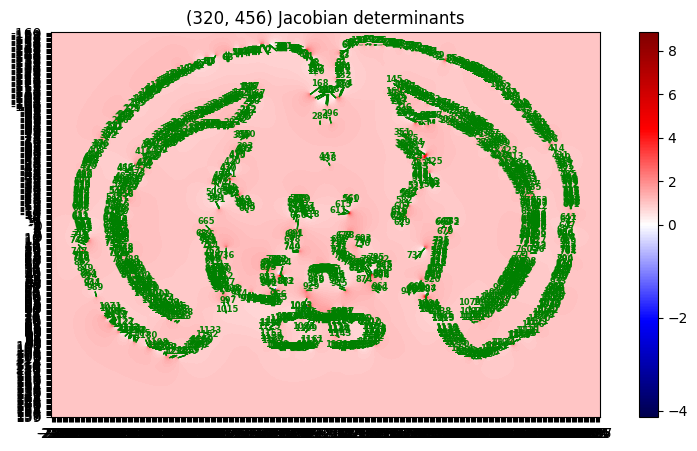

Number of negative Jacobian determinants: 168

Iteration 1
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


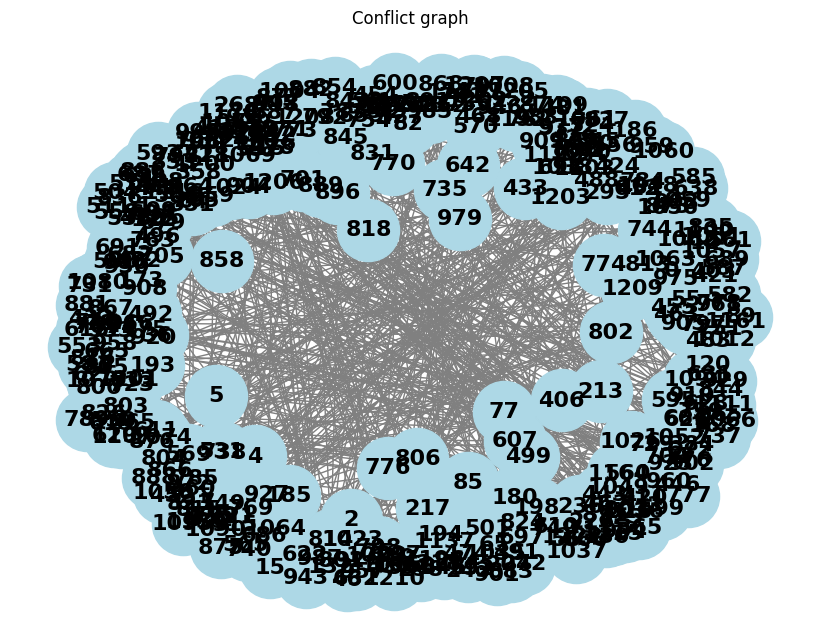

Candidates: [814]
Max degree candidates: 814
Removing 814
Number of negative Jacobian determinants: 164
Time taken: 1525.2526078224182

Iteration 2
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


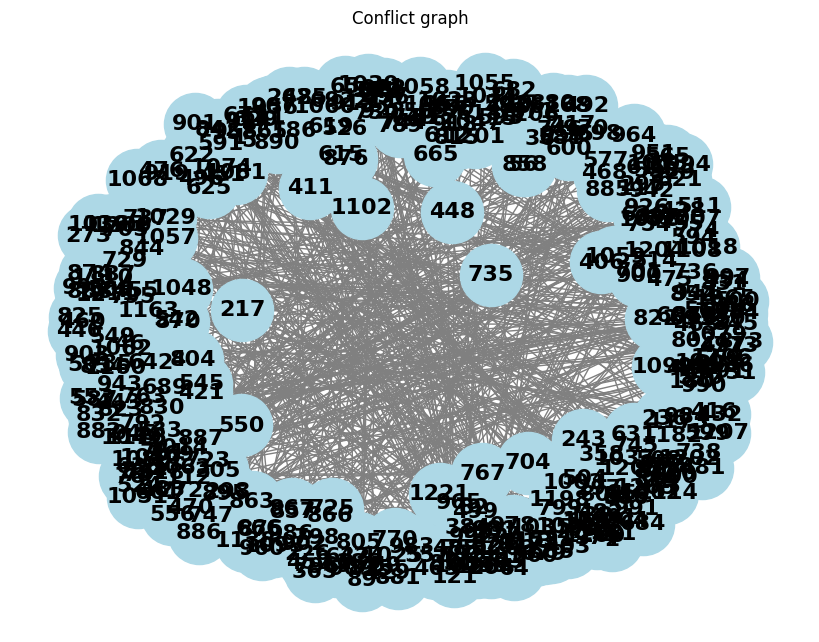

Candidates: [1073]
Max degree candidates: 1073
Removing 1073
Number of negative Jacobian determinants: 156
Time taken: 1535.5904688835144

Iteration 3
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


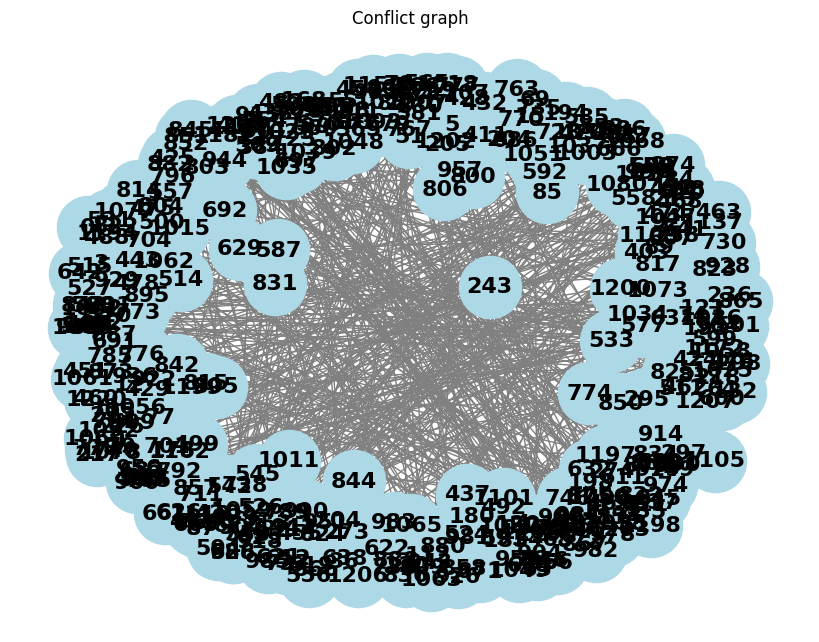

Candidates: [851]
Max degree candidates: 851
Removing 851
Number of negative Jacobian determinants: 156
Time taken: 1441.3370099067688

Iteration 4
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


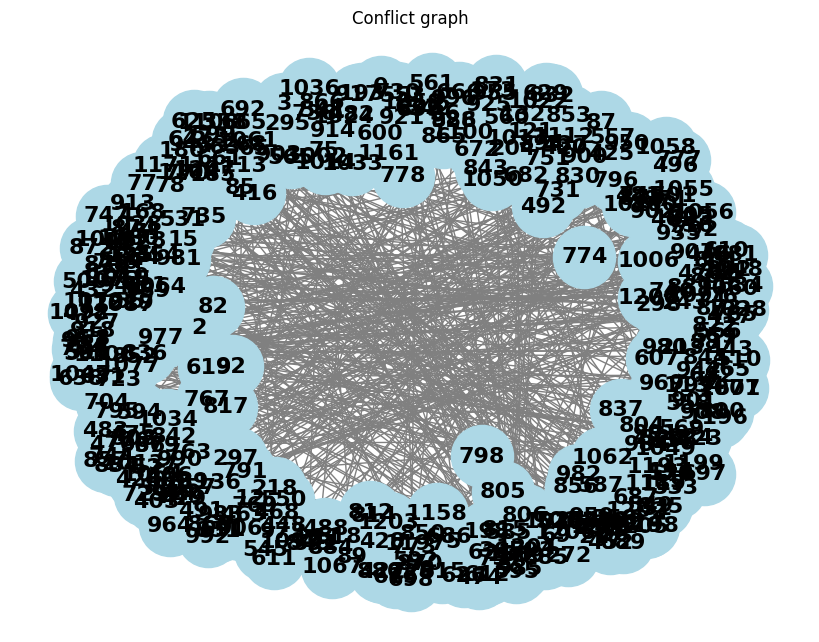

Candidates: [777, 900]
Max degree candidates: 900
Removing 900
Number of negative Jacobian determinants: 152
Time taken: 1505.2331776618958

Iteration 5
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


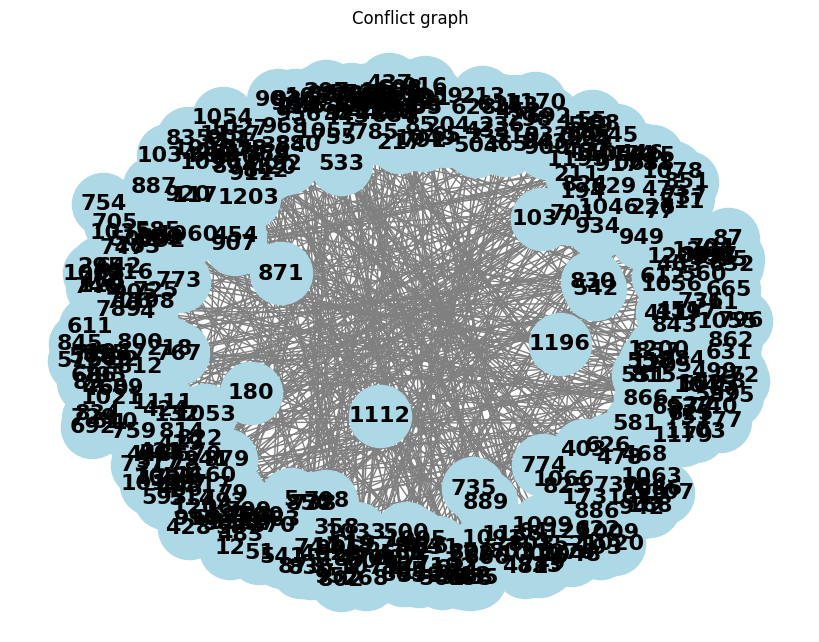

Candidates: [777]
Max degree candidates: 777
Removing 777
Number of negative Jacobian determinants: 152
Time taken: 1533.749913930893

Iteration 6
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


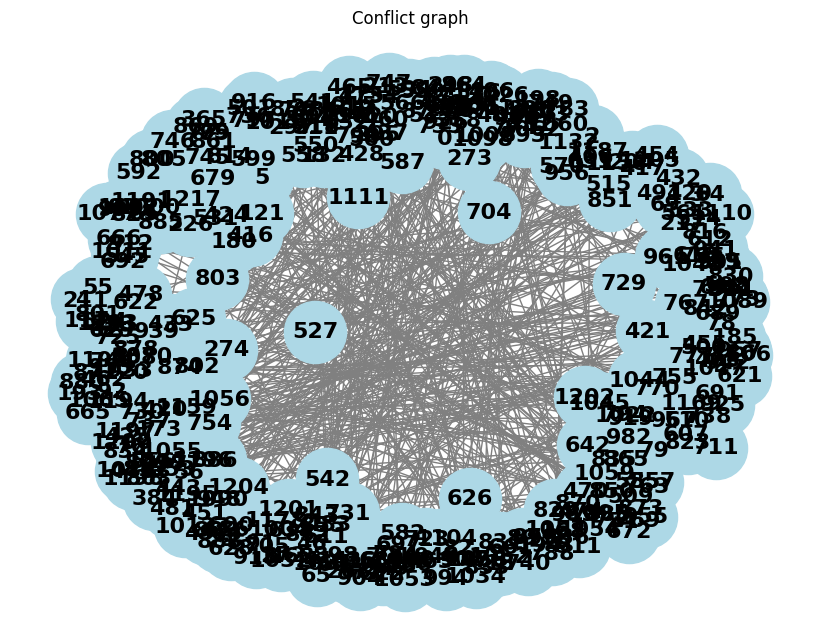

Candidates: [872, 955]
Max degree candidates: 872
Removing 872
Number of negative Jacobian determinants: 151
Time taken: 1539.718014717102

Iteration 7
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


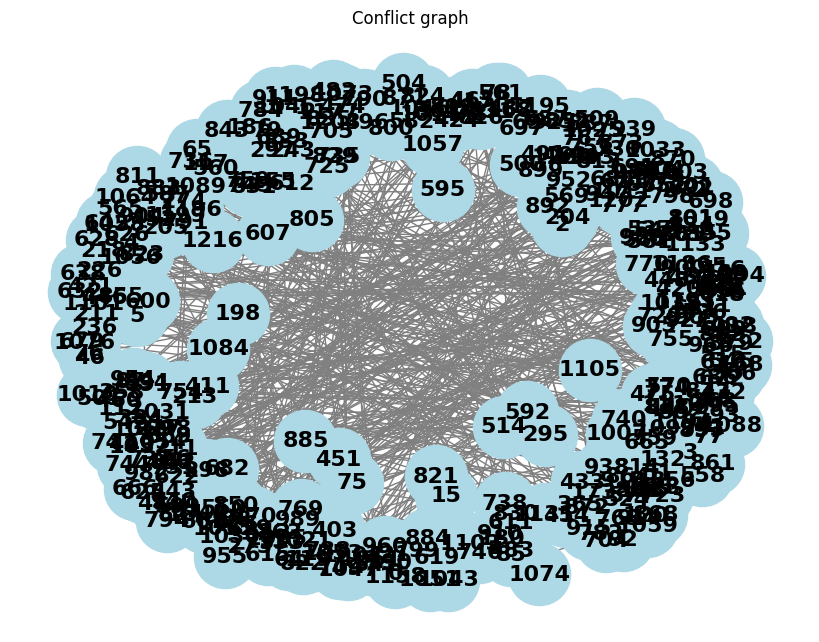

Candidates: [954]
Max degree candidates: 954
Removing 954
Number of negative Jacobian determinants: 149
Time taken: 755.3237743377686

Iteration 8
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


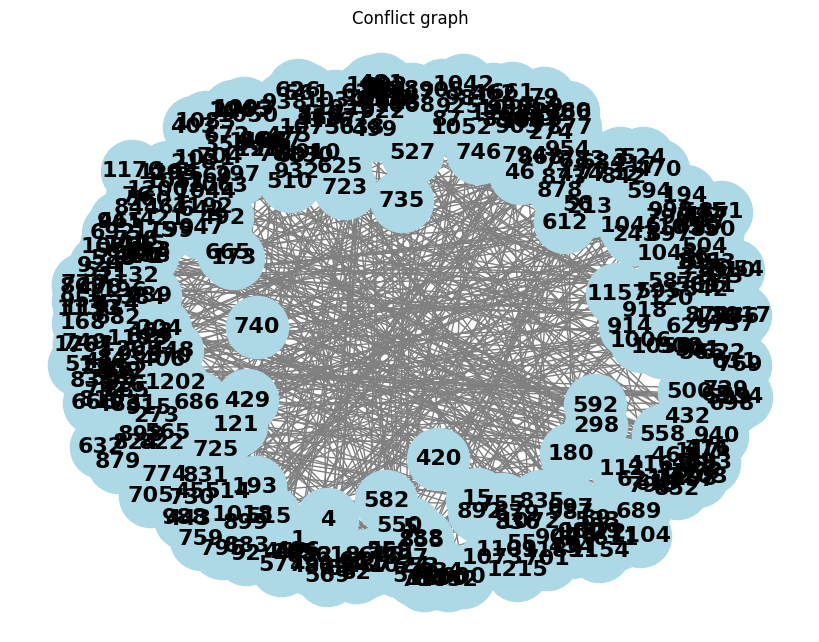

Candidates: [863, 883]
Max degree candidates: 863
Removing 863
Number of negative Jacobian determinants: 149
Time taken: 635.1921257972717

Iteration 9
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


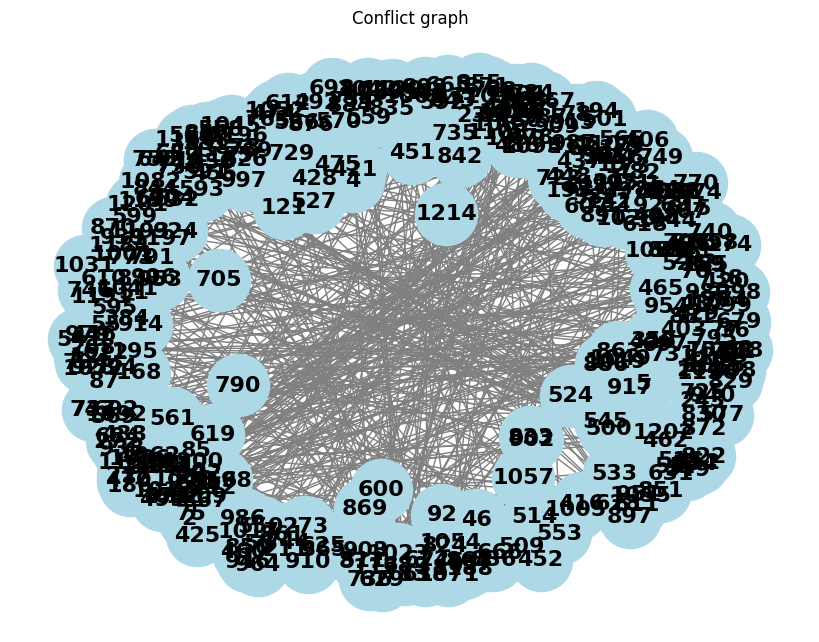

Candidates: [882]
Max degree candidates: 882
Removing 882
Number of negative Jacobian determinants: 148
Time taken: 633.8036587238312

Iteration 10
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


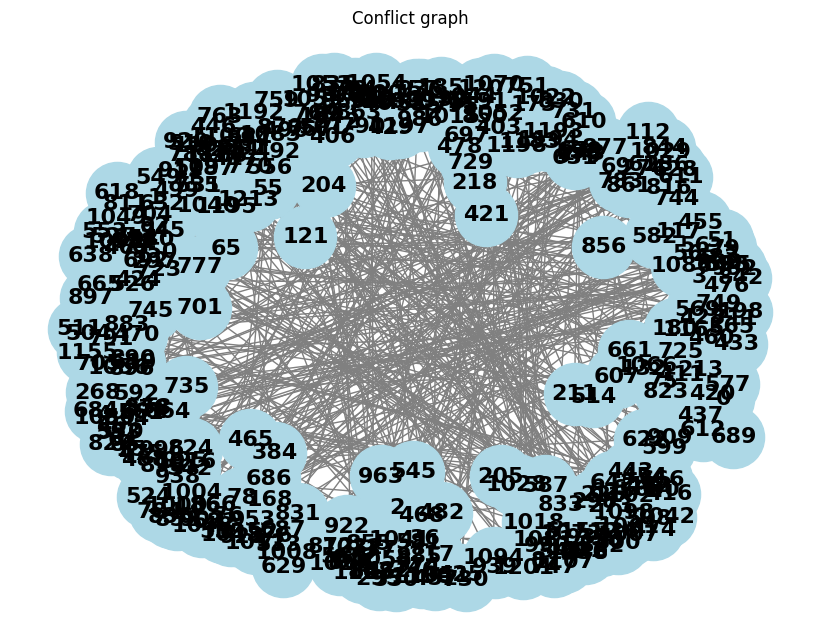

Candidates: [268, 476, 628, 1022, 1201]
Max degree candidates: 628
Removing 628
Number of negative Jacobian determinants: 148
Time taken: 632.5935904979706

Iteration 11
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


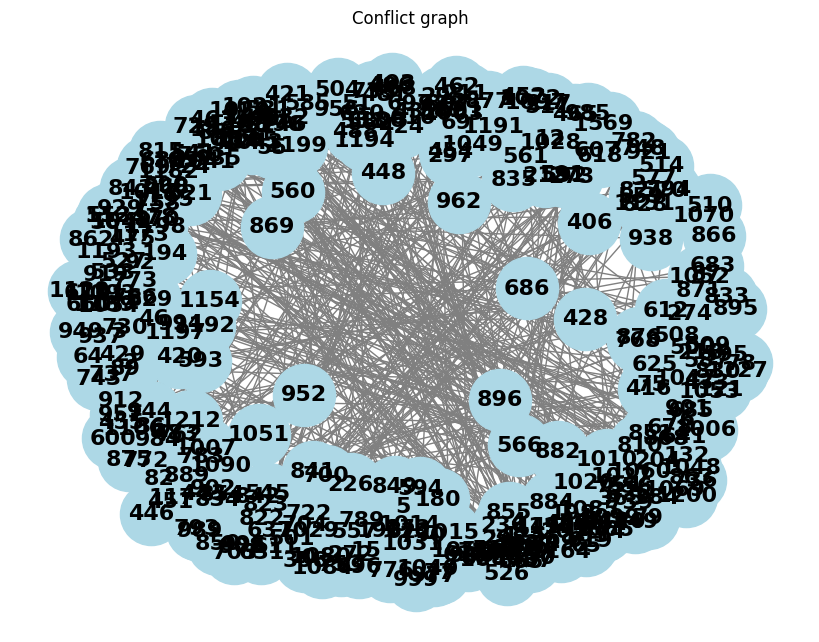

Candidates: [268, 476, 1021, 1200]
Max degree candidates: 476
Removing 476
Number of negative Jacobian determinants: 148
Time taken: 631.9112343788147

Iteration 12
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


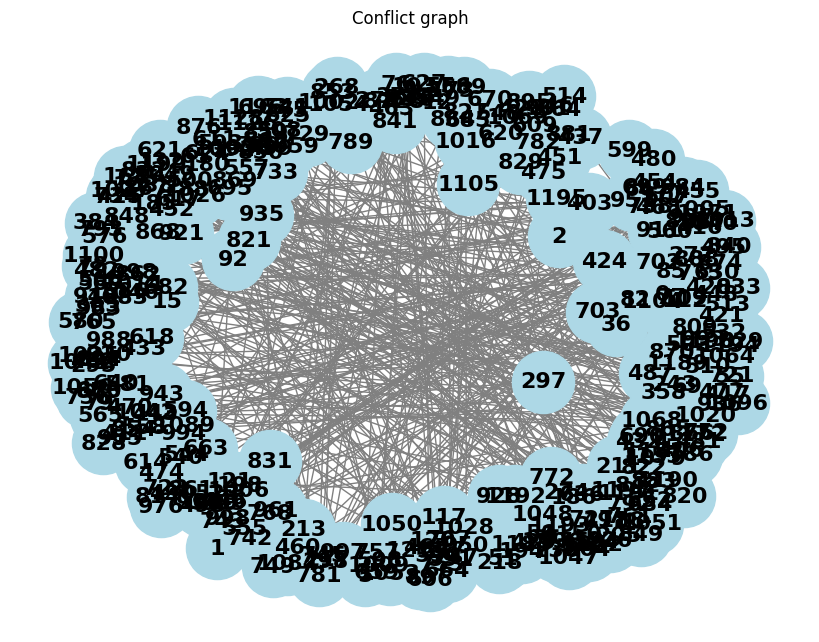

Candidates: [268, 1020, 1199]
Max degree candidates: 1020
Removing 1020
Number of negative Jacobian determinants: 142
Time taken: 632.9366369247437

Iteration 13
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


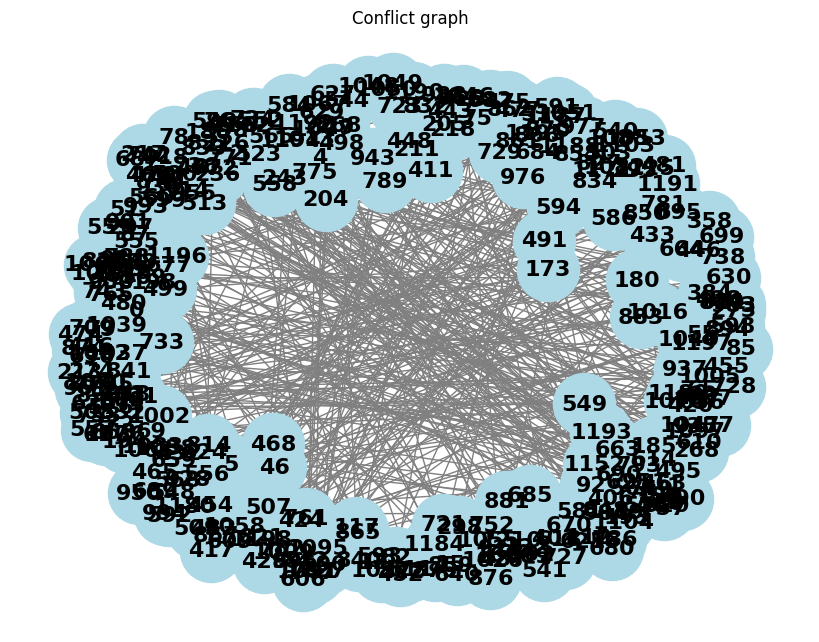

Candidates: [268, 1198]
Max degree candidates: 1198
Removing 1198
Number of negative Jacobian determinants: 136
Time taken: 632.069504737854

Iteration 14
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


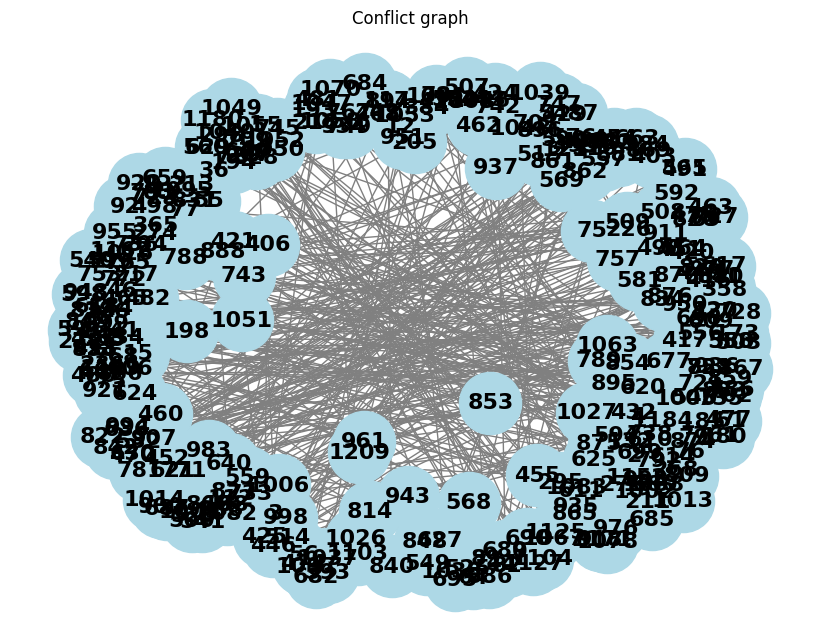

Candidates: [268]
Max degree candidates: 268
Removing 268
Number of negative Jacobian determinants: 135
Time taken: 629.8247067928314

Iteration 15
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


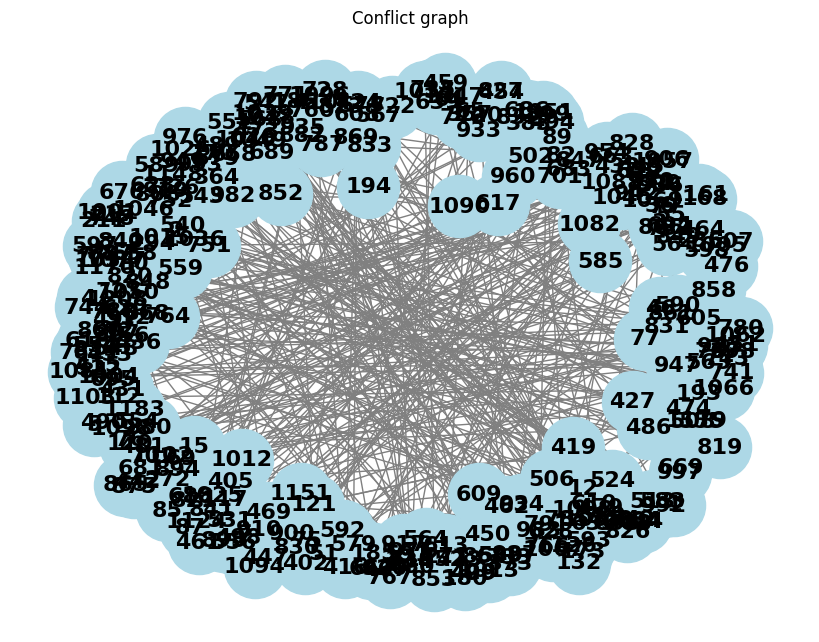

Candidates: [734]
Max degree candidates: 734
Removing 734
Number of negative Jacobian determinants: 132
Time taken: 629.7923941612244

Iteration 16
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


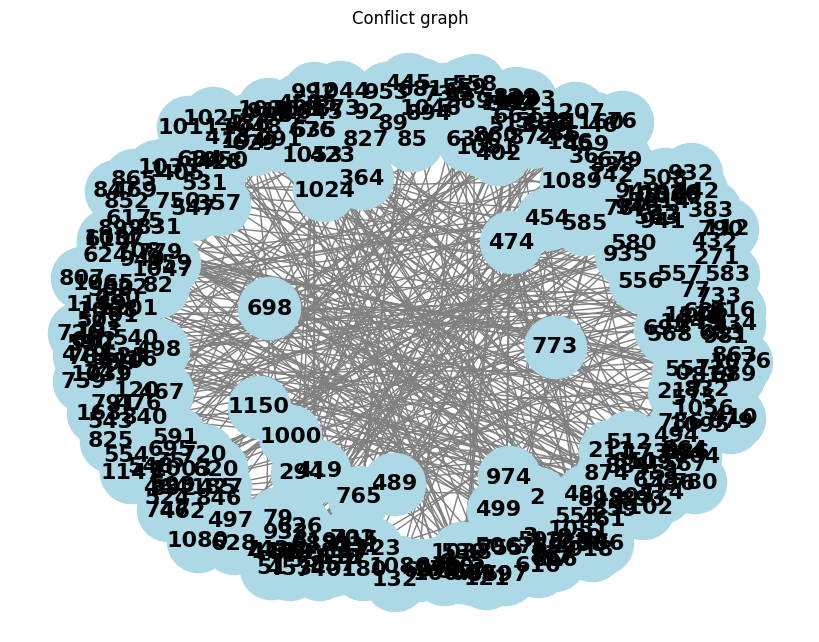

Candidates: [779, 818]
Max degree candidates: 818
Removing 818
Number of negative Jacobian determinants: 126
Time taken: 630.3195345401764

Iteration 17
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


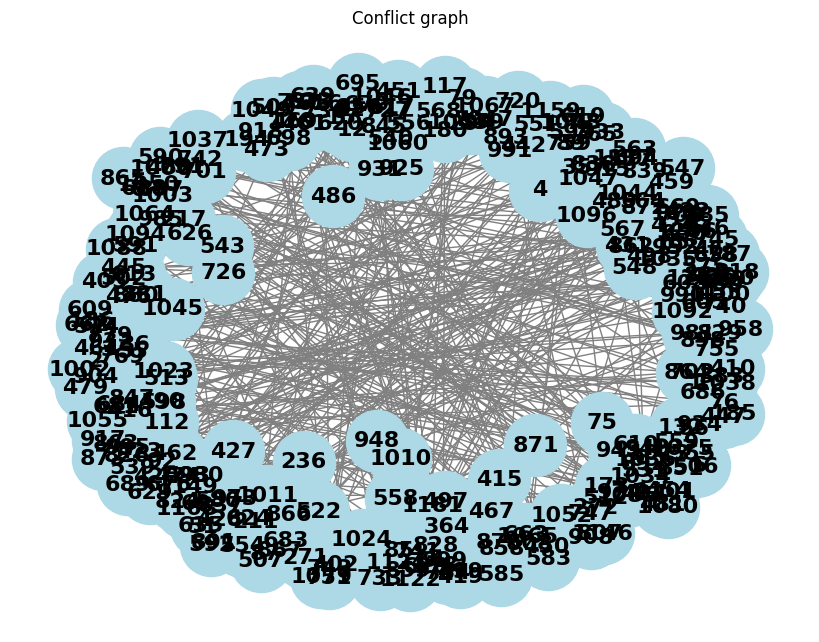

Candidates: [424, 635, 779, 974, 981, 1064]
Max degree candidates: 779
Removing 779
Number of negative Jacobian determinants: 122
Time taken: 628.2983107566833

Iteration 18
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


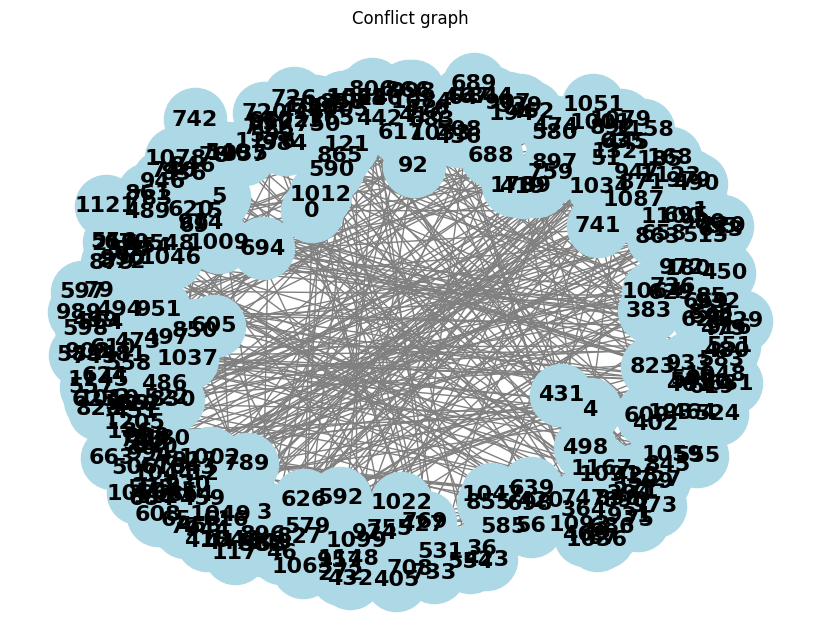

Candidates: [424, 635, 973, 980, 1063]
Max degree candidates: 635
Removing 635
Number of negative Jacobian determinants: 121
Time taken: 628.7582378387451

Iteration 19
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


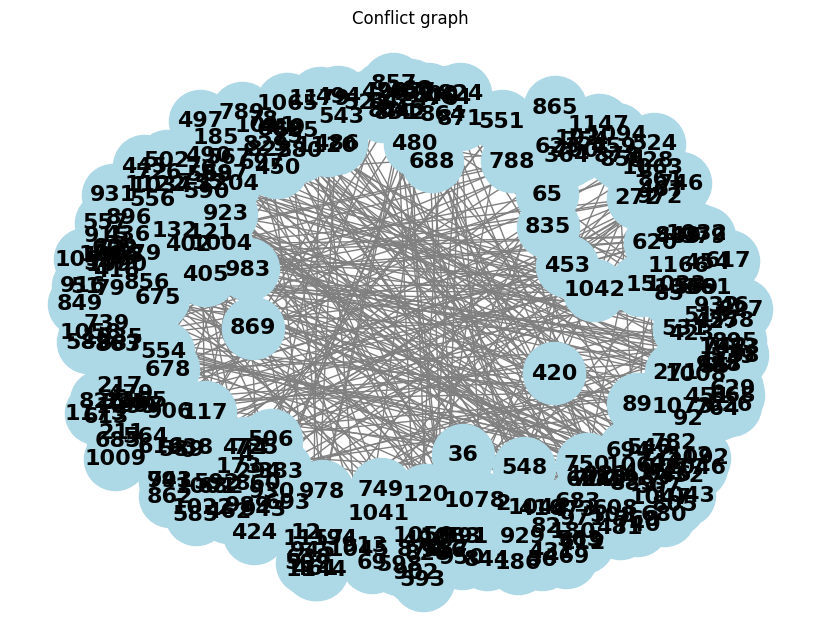

Candidates: [424, 972, 979, 1062]
Max degree candidates: 972
Removing 972
Number of negative Jacobian determinants: 120
Time taken: 626.5780439376831

Iteration 20
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


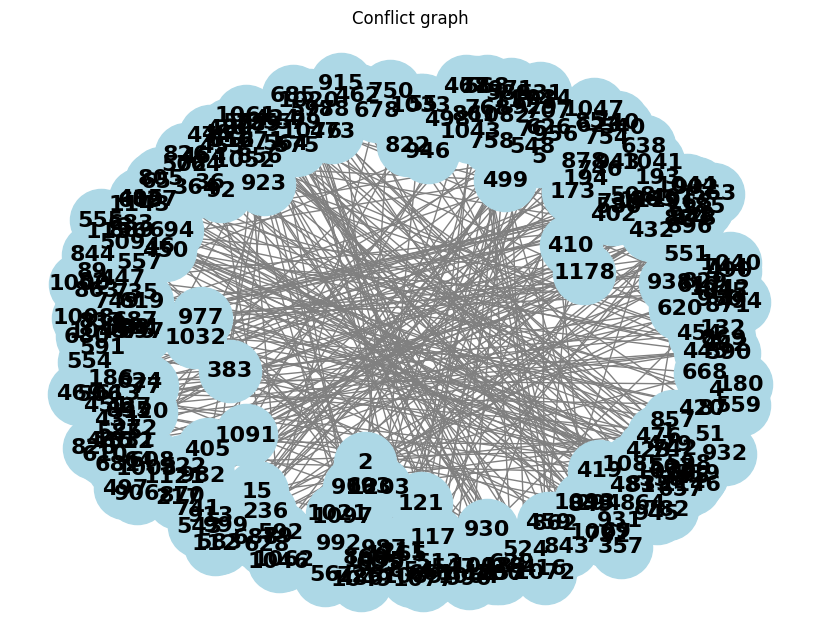

Candidates: [424, 978, 1061]
Max degree candidates: 978
Removing 978
Number of negative Jacobian determinants: 118
Time taken: 625.6002447605133

Iteration 21
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


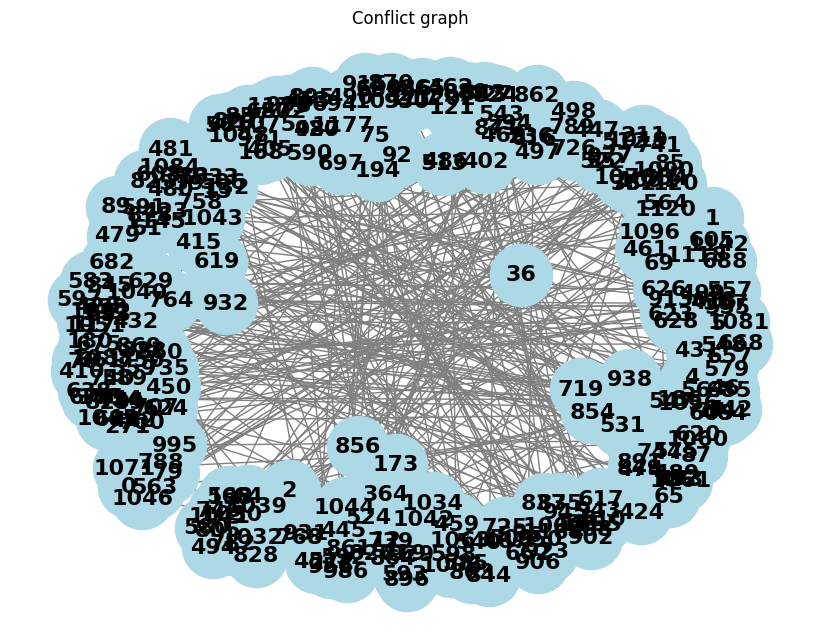

Candidates: [424, 1060]
Max degree candidates: 1060
Removing 1060
Number of negative Jacobian determinants: 115
Time taken: 622.7532479763031

Iteration 22
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


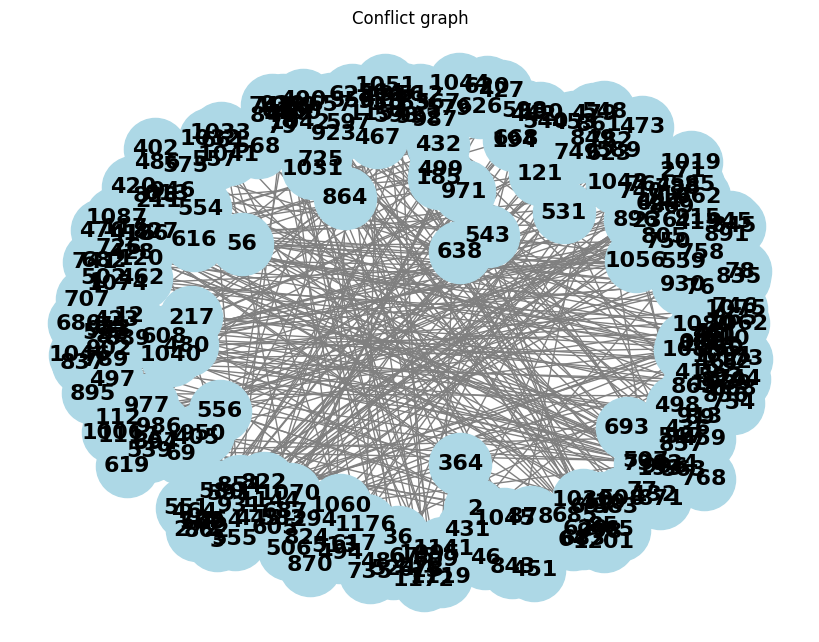

Candidates: [424]
Max degree candidates: 424
Removing 424
Number of negative Jacobian determinants: 112
Time taken: 623.2193820476532

Iteration 23
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


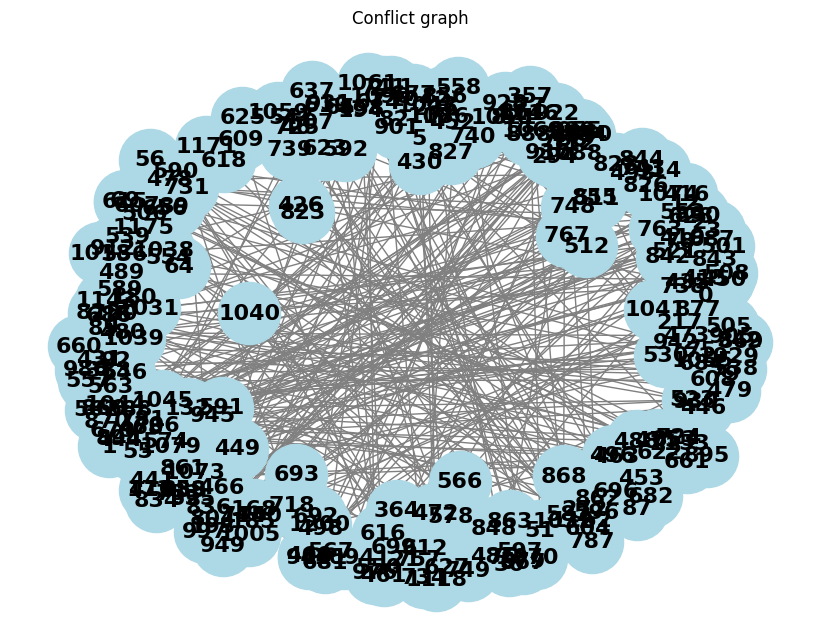

Candidates: [468, 628, 731]
Max degree candidates: 468
Removing 468
Number of negative Jacobian determinants: 111
Time taken: 622.0032000541687

Iteration 24
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


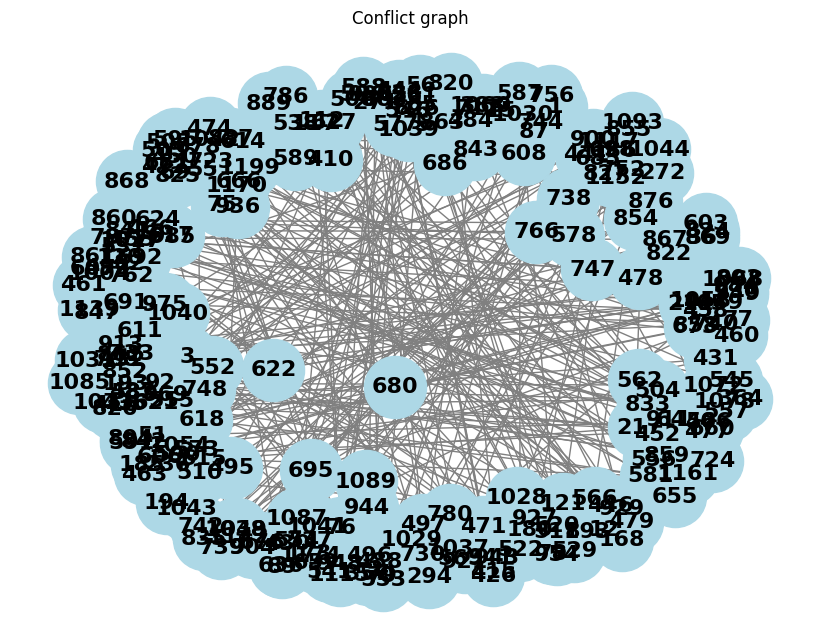

Candidates: [627, 730]
Max degree candidates: 627
Removing 627
Number of negative Jacobian determinants: 111
Time taken: 621.6368889808655

Iteration 25
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


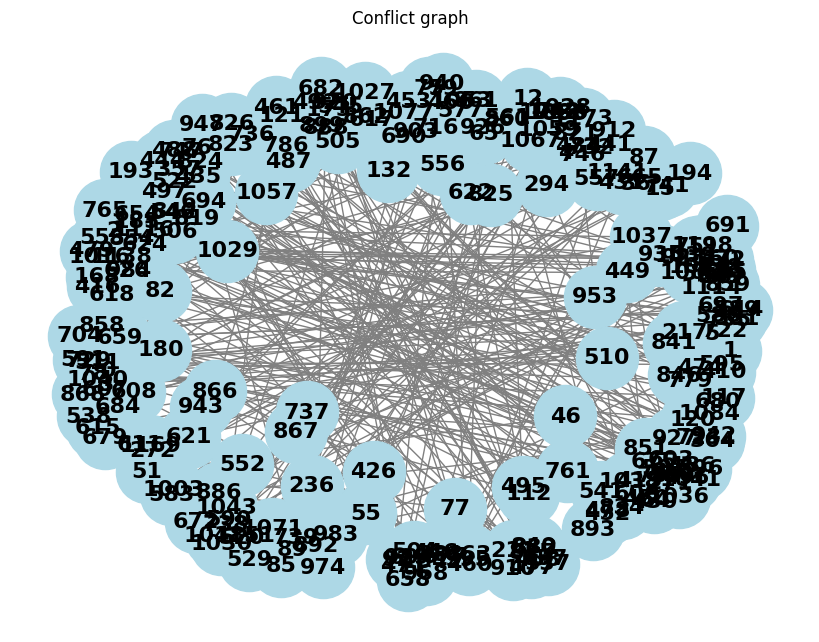

Candidates: [729]
Max degree candidates: 729
Removing 729
Number of negative Jacobian determinants: 111
Time taken: 620.953099489212

Iteration 26
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


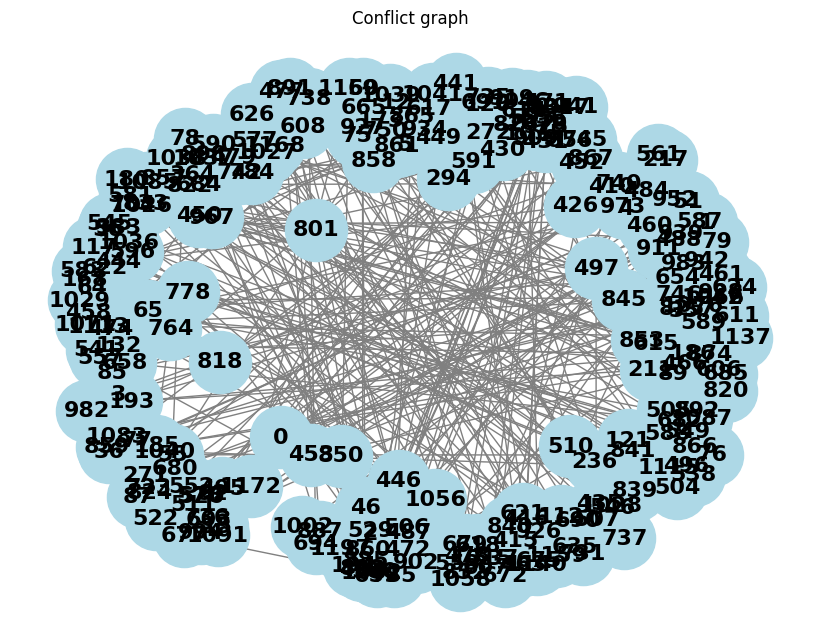

Candidates: [444]
Max degree candidates: 444
Removing 444
Number of negative Jacobian determinants: 110
Time taken: 619.218991279602

Iteration 27
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


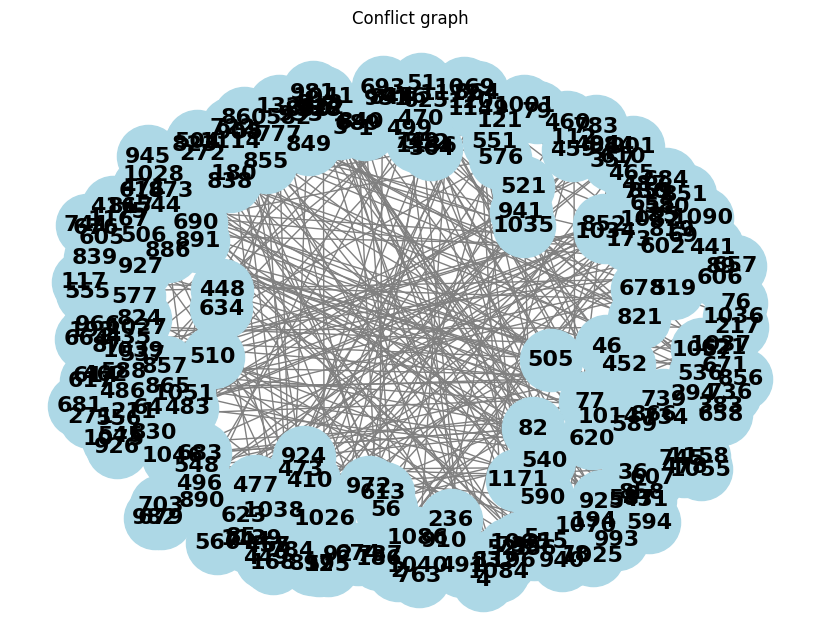

Candidates: [478, 658, 784, 993, 1114]
Max degree candidates: 658
Removing 658
Number of negative Jacobian determinants: 106
Time taken: 620.3391680717468

Iteration 28
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


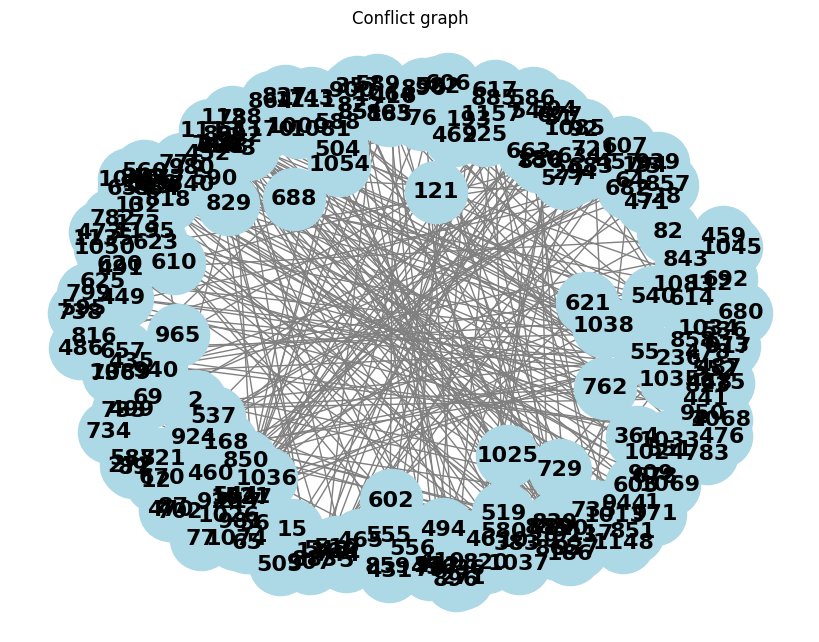

Candidates: [478, 783, 992, 1113]
Max degree candidates: 992
Removing 992
Number of negative Jacobian determinants: 105
Time taken: 618.9586408138275

Iteration 29
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


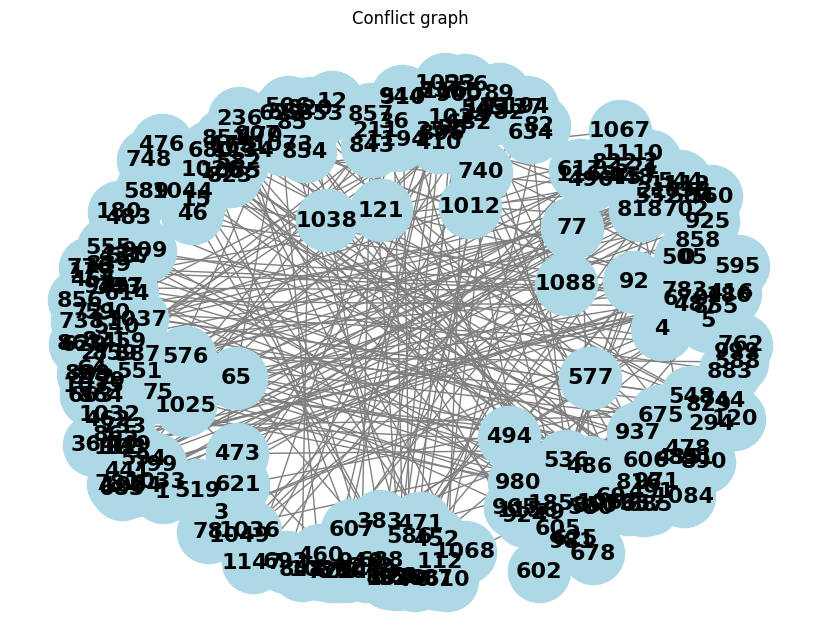

Candidates: [478, 783, 1112]
Max degree candidates: 478
Removing 478
Number of negative Jacobian determinants: 105
Time taken: 618.9880843162537

Iteration 30
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


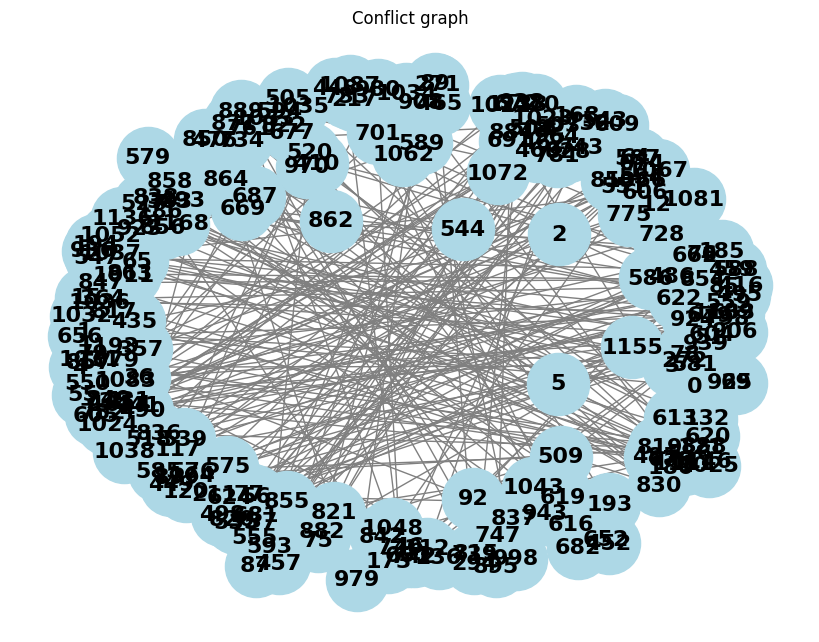

Candidates: [782, 1111]
Max degree candidates: 782
Removing 782
Number of negative Jacobian determinants: 104
Time taken: 620.1124856472015

Iteration 31
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


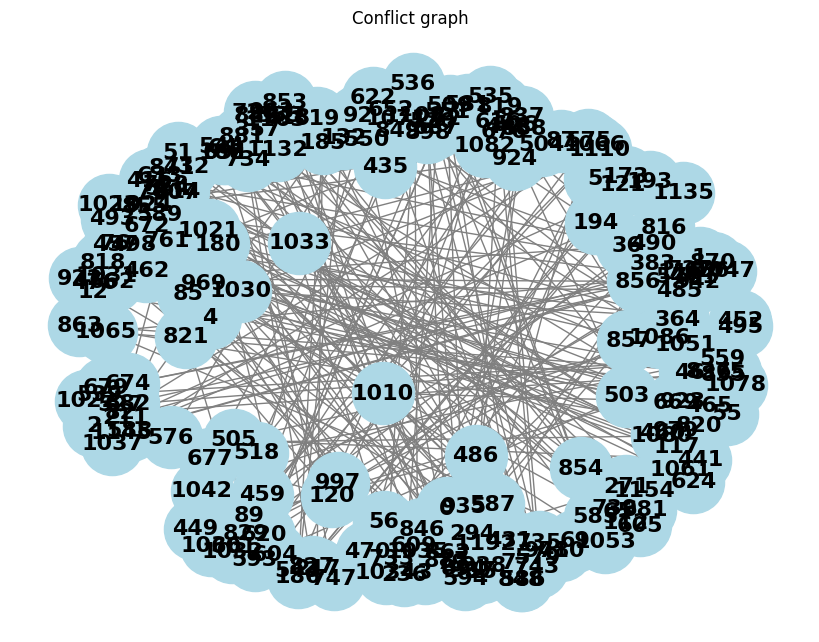

Candidates: [1110]
Max degree candidates: 1110
Removing 1110
Number of negative Jacobian determinants: 104
Time taken: 618.354364156723

Iteration 32
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


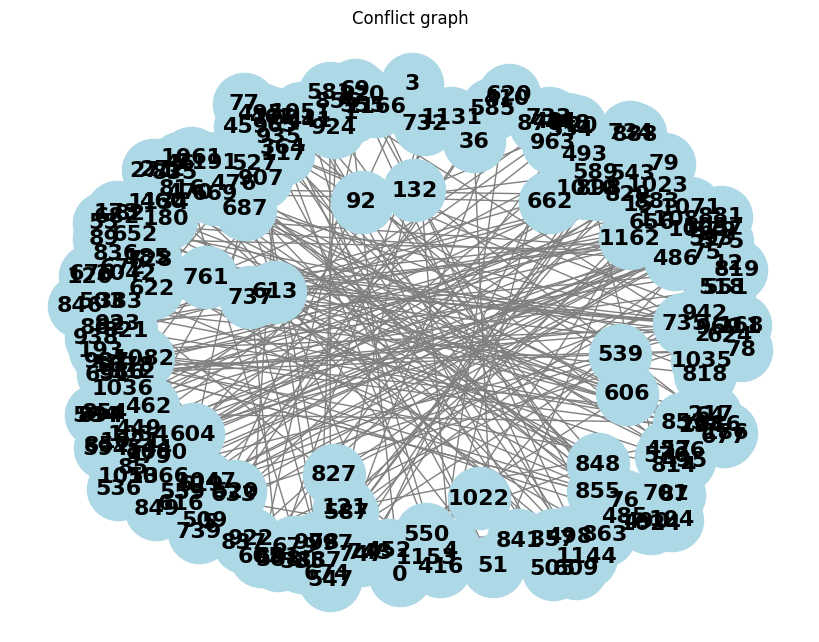

Candidates: [186, 593, 579, 829, 887]
Max degree candidates: 186
Removing 186
Number of negative Jacobian determinants: 102
Time taken: 615.6474981307983

Iteration 33
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


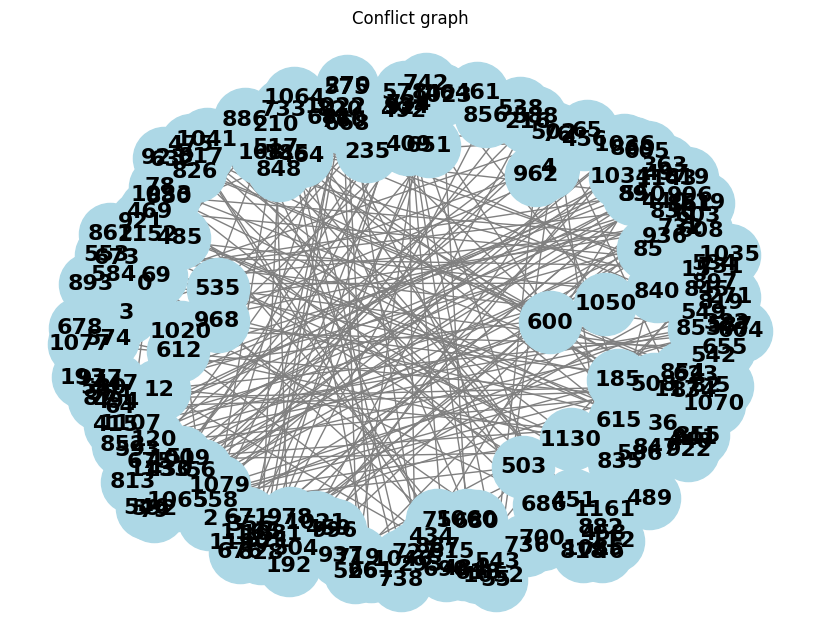

Candidates: [592, 578, 828, 886]
Max degree candidates: 592
Removing 592
Number of negative Jacobian determinants: 102
Time taken: 617.5230393409729

Iteration 34
Building conflict graph...
Node scores: [ 7.33669374  7.21744979  7.77548141 ... 14.69972711 13.92874443 13.71866221]


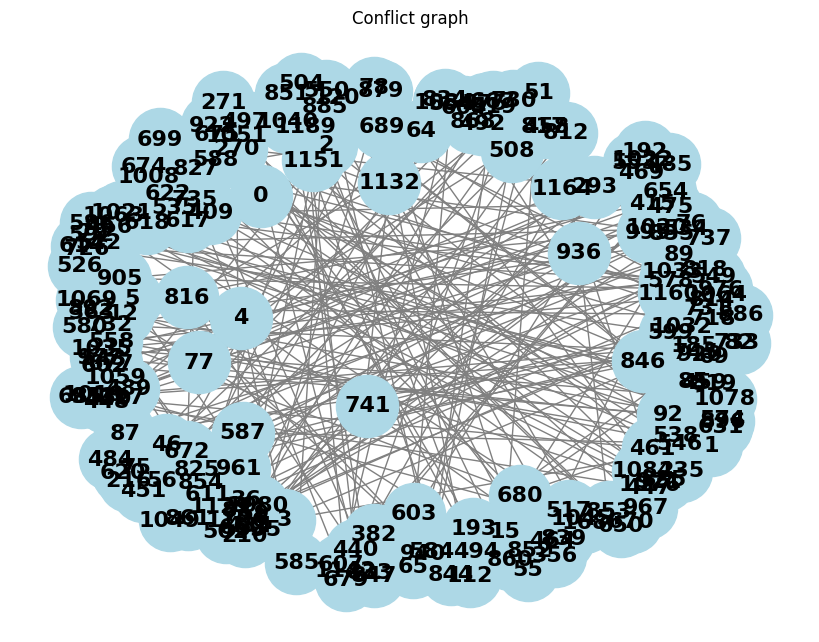

Candidates: [578, 827, 885]
Max degree candidates: 578
Removing 578
Number of negative Jacobian determinants: 101
Time taken: 623.3484165668488

Iteration 35
Building conflict graph...


In [ ]:
d = Data(mpoints, fpoints, (320, 456))
grid_size = 37

# Keep track of statistics
num_correspondences_removed = 0
negative_counts = [d.count_negatives()]

# Show the initial data object
print("Data object created.")
d.show(show_text=False)
print("Number of negative Jacobian determinants:", d.count_negatives())

while d.count_negatives() > 0:
    start_time = time.time()
    print("\nIteration", num_correspondences_removed + 1)
    
    # Build conflict graph and remove the correspondence with the maximum degree (if any)
    print("Building conflict graph...")
    g, scores = d.build_conflict_graph(grid_size=grid_size, show=False, show_text=False, show_axis=False)
    print("Node scores:", scores)
    show_graph(g)
    idx, _ = get_max_degree(g, scores)
    print("Max degree candidates:", idx)

    # Remove the correspondence with the maximum degree
    print("Removing", idx)
    d = d.remove(idx, show=False)
    
    # Keep track of statistics
    num_negatives = d.count_negatives()
    negative_counts.append(num_negatives)
    print("Number of negative Jacobian determinants:", num_negatives)
    num_correspondences_removed += 1
    print("Time taken:", time.time() - start_time)
    
print("Number of correspondences removed:", num_correspondences_removed)

Number of correspondences: 122
Number of correspondences removed: 3
Number of negative Jacobian determinants: 13
Minimum Jacobian determinant value: -0.4955090851522568


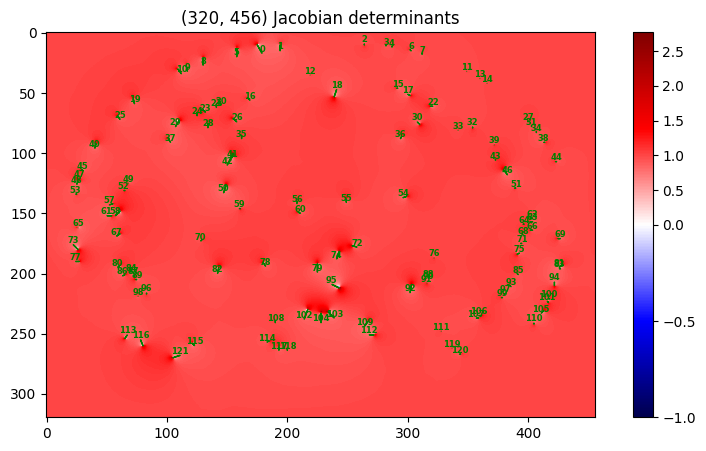

In [ ]:
# Last iteration
print("Number of correspondences:", d.mpoints.shape[0])
print("Number of correspondences removed:", num_correspondences_removed)
print("Number of negative Jacobian determinants:", d.count_negatives())
print("Minimum Jacobian determinant value:", d.min())
d.show(show_text=False, show_axis=False)

# Plot the number of negative Jacobian determinants over time
f = plt.figure(figsize=(8, 6))
plt.plot(negative_counts)
plt.xlabel("Iteration")
plt.ylabel("Number of negative Jacobian determinants")
plt.title("Number of negative Jacobian determinants over time")
plt.show()
f.clear()
plt.close(f)

## TODO
https://docs.google.com/presentation/d/15IbpfKPsd-i0yW5-oxV3nKeR90E4vTXJnpKNM1btXdw/edit#slide=id.p


In [ ]:
def compare(self, idx1: int, idx2: int, grid_size=None, title=None, figsize=(10, 5), 
            fontsize=6, show=True, show_text=False, show_axis=False):
    """Compare two correspondences in the grid.
    
    Args:
        idx1 (int): Index of the first point.
        idx2 (int): Index of the second point.
        
    Returns:
        Data: New Data object with only the two correspondences compared.
    """
    mpoint1 = self.mpoints[idx1].copy()
    fpoint1 = self.fpoints[idx1].copy()
    mpoint2 = self.mpoints[idx2].copy()
    fpoint2 = self.fpoints[idx2].copy()
    
    if grid_size is not None:
        center = grid_size // 2
        center_array = np.array([0, center, center])
        #center_diff = center_array - mpoint1
        center_diff = center_array - fpoint1
        
        # Move points to center of grid
        mpoint1 += center_diff
        fpoint1 += center_diff
        mpoint2 += center_diff
        fpoint2 += center_diff

    mpoints = np.vstack((mpoint1, mpoint2))
    fpoints = np.vstack((fpoint1, fpoint2))
    
    if grid_size is None:
        d = Data(mpoints, fpoints, self.resolution)
    else:
        d = Data(mpoints, fpoints, (grid_size, grid_size))
        
    if show:
        if title is None:
            title = f"Comparing {idx1} and {idx2}, min = {d.min():.2f}"
        d.show(title=title, figsize=figsize, fontsize=fontsize, show_text=show_text, show_axis=show_axis)
    return d

In [ ]:
def lut_compare(mpoints: np.ndarray, fpoints: np.ndarray,
                idx1: int, idx2: int, lut_table: np.ndarray, grid_size: int = 37):
    """
    Compare two correspondences in the grid using the LUT.
    
    Args:
        mpoints (np.ndarray): Matched points in the model image.
        fpoints (np.ndarray): Corresponding points in the frame image.
        idx1 (int): Index of the first point.
        idx2 (int): Index of the second point.
        lut_table (np.ndarray): Look-up table for correspondences.
        grid_size (int): Size of the grid.
        
    Returns:
    
    """
    mpoint1 = mpoints[idx1].copy()
    fpoint1 = fpoints[idx1].copy()
    mpoint2 = mpoints[idx2].copy()
    fpoint2 = fpoints[idx2].copy()
    
    if grid_size is not None:
        center = grid_size // 2
        center_array = np.array([0, center, center])
        #center_diff = center_array - mpoint1
        center_diff = center_array - fpoint1
        
        # Move points to center of grid
        mpoint1 += center_diff
        fpoint1 += center_diff
        mpoint2 += center_diff
        fpoint2 += center_diff

### Test on more slices

### Compute accuracy

###  Quantify real Jacobians are subset of compared pairwise Jacobians

In [ ]:

    def compare(self, idx1: int, idx2: int, grid_size=None, title=None, figsize=(10, 5), 
                fontsize=6, show=True, show_text=False, show_axis=False):
        """Compare two correspondences in the grid.
        
        Args:
            idx1 (int): Index of the first point.
            idx2 (int): Index of the second point.
            
        Returns:
            Data: New Data object with only the two correspondences compared.
        """
        mpoint1 = self.mpoints[idx1].copy()
        fpoint1 = self.fpoints[idx1].copy()
        mpoint2 = self.mpoints[idx2].copy()
        fpoint2 = self.fpoints[idx2].copy()
        
        if grid_size is not None:
            center = grid_size // 2
            center_array = np.array([0, center, center])
            #center_diff = center_array - mpoint1
            center_diff = center_array - fpoint1
            
            # Move points to center of grid
            mpoint1 += center_diff
            fpoint1 += center_diff
            mpoint2 += center_diff
            fpoint2 += center_diff

        mpoints = np.vstack((mpoint1, mpoint2))
        fpoints = np.vstack((fpoint1, fpoint2))
        
        if grid_size is None:
            d = Data(mpoints, fpoints, self.resolution)
        else:
            d = Data(mpoints, fpoints, (grid_size, grid_size))
            
        if show:
            if title is None:
                title = f"Comparing {idx1} and {idx2}, min = {d.min():.2f}"
            d.show(title=title, figsize=figsize, fontsize=fontsize, show_text=show_text, show_axis=show_axis)
        return d
    
    
    def min(self):
        """Find the minimum Jacobian determinant value in the grid.
        
        Returns:
            float: Minimum Jacobian determinant value.
        """
        return np.min(self.jdet_field)
    
    
    def count_negatives(self):
        """
        Counts the number of negative Jacobian determinants in the grid.
        
        Returns:
            int: Number of negative Jacobian determinants.
        """
        return np.sum(self.jdet_field <= 0)
    
    
    def get_negative_coordinates(self, show=True):
        """
        Get the coordinates of negative Jacobian determinants in the grid.
        
        Args:
            show (bool): Whether to print the coordinates of the negative Jacobian determinants.
            
        Returns:
            np.ndarray: Array of coordinates of negative Jacobian determinants.
        """
        # Get coordinate of negative Jacobian determinants
        negatives = np.argwhere(self.jdet_field <= 0)
        if show:
            print("Negative Jacobian determinants:")
            for y, x in negatives:
                print(f"({y}, {x})")
        return negatives
    
    
    def build_conflict_graph(self, threshold: float = 0.0, grid_size=101, 
                             show=True, fontsize=6, show_text=False, show_axis=False):
        """Build a conflict graph based on the Jacobian determinant field.
        
        Args:
            threshold (float, optional): Threshold for conflict detection. Defaults to 0.0.
            
        Returns:
            nx.Graph: Conflict graph where keys are indices of moving points and values are lists of conflicting indices.
        """
        conflict_graph = nx.Graph()
        scores = np.zeros(self.mpoints.shape[0])
        
        #scores = np.full(self.mpoints.shape[0], np.inf)
        
        # Check for conflicts between correspondence pairs
        num_correspondences = self.mpoints.shape[0]
        #for i in tqdm(range(num_correspondences)):
        for i in range(num_correspondences):
            
            # Filter points and compare only to nearby points
            current_point = self.fpoints[i]
            neighbor_indices = points_in_grid(self.fpoints, current_point, grid_size=grid_size)
            neighbor_indices = neighbor_indices[neighbor_indices >= i]
            
            #for j in tqdm(range(i + 1, num_correspondences), leave=False):
            #for nj in tqdm(range(len(neighbor_indices)), leave=False):
            for nj in range(len(neighbor_indices)):
                j = neighbor_indices[nj]
                d = self.compare(i, j, grid_size=grid_size, show=show, fontsize=fontsize, show_text=show_text, show_axis=show_axis)
                min_jdet = d.min()
                scores[i] += min_jdet
                scores[j] += min_jdet
                if min_jdet < threshold:
                    conflict_graph.add_edge(i, j, weight=min_jdet)
        return conflict_graph, scores
        

In [5]:
moving_path = "data/corrected_correspondences_count_touching/mpoints.npy"
fixed_path = "data/corrected_correspondences_count_touching/fpoints.npy"
CURR_IDX = 350

mpoints = np.load(moving_path)
fpoints = np.load(fixed_path)

# Get only elements that are of the current index
mpoints = mpoints[mpoints[:, 0] == CURR_IDX]
fpoints = fpoints[fpoints[:, 0] == CURR_IDX]
mpoints[:, 0] = 0
fpoints[:, 0] = 0

# Get every N points
N = 5
mpoints = mpoints[::N]
fpoints = fpoints[::N]

resolution = np.zeros((1, 320, 456))
deformation, _, _, _, _ = laplacian.sliceToSlice3DLaplacian(resolution, mpoints, fpoints)
jdet_field = jacobian.sitk_jacobian_determinant(deformation)[0]

print("Number of correspondences:", mpoints.shape[0])

d = Data(mpoints, fpoints, (320, 456))

Number of correspondences: 250


In [6]:
negative_jdets = d.get_negative_coordinates(show=False)

In [8]:
num_correspondences = d.mpoints.shape[0]
pairwise_negatives = []
#for i in tqdm(range(num_correspondences)):
for i in tqdm(range(num_correspondences)):
    
    # Filter points and compare only to nearby points
    current_point = d.fpoints[i]
    neighbor_indices = points_in_grid(d.fpoints, current_point, grid_size=101)
    neighbor_indices = neighbor_indices[neighbor_indices > i]
    
    mpoint1 = d.mpoints[i].copy()
    fpoint1 = d.fpoints[i].copy()
    
    for nj in tqdm(range(len(neighbor_indices)), leave=False):
        j = neighbor_indices[nj]
        
        mpoint2 = d.mpoints[j].copy()
        fpoint2 = d.fpoints[j].copy()

        Cmpoints = np.vstack((mpoint1, mpoint2))
        Cfpoints = np.vstack((fpoint1, fpoint2))
        
        # Run Laplacian and Jacobian determinant calculations and save the Jacobian determinant field
        grid_resolution = np.zeros((1, d.resolution[0], d.resolution[1]))
        deformation, _, _, _, _ = laplacian.sliceToSlice3DLaplacian(grid_resolution, Cmpoints, Cfpoints)
        jdet_field = jacobian.sitk_jacobian_determinant(deformation)[0]
        negatives = np.argwhere(jdet_field <= 0)
        pairwise_negatives.append(negatives)

pairwise_negatives = np.array(pairwise_negatives)

  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (2689,) + inhomogeneous part.

In [10]:
import numpy as np
from tqdm import tqdm
from concurrent.futures import ProcessPoolExecutor

def process_pair(i, j, d):
    mpoint1 = d.mpoints[i].copy()
    fpoint1 = d.fpoints[i].copy()
    mpoint2 = d.mpoints[j].copy()
    fpoint2 = d.fpoints[j].copy()

    Cmpoints = np.vstack((mpoint1, mpoint2))
    Cfpoints = np.vstack((fpoint1, fpoint2))

    # Run Laplacian and Jacobian determinant calculations and save the Jacobian determinant field
    grid_resolution = np.zeros((1, d.resolution[0], d.resolution[1]))
    deformation, _, _, _, _ = laplacian.sliceToSlice3DLaplacian(grid_resolution, Cmpoints, Cfpoints)
    jdet_field = jacobian.sitk_jacobian_determinant(deformation)[0]
    negatives = np.argwhere(jdet_field <= 0)
    return negatives

num_correspondences = d.mpoints.shape[0]
pairwise_negatives2 = []

with ProcessPoolExecutor() as executor:
    futures = []
    for i in tqdm(range(num_correspondences)):
        # Filter points and compare only to nearby points
        current_point = d.fpoints[i]
        neighbor_indices = points_in_grid(d.fpoints, current_point, grid_size=101)
        neighbor_indices = neighbor_indices[neighbor_indices > i]

        for nj in range(len(neighbor_indices)):
            j = neighbor_indices[nj]
            futures.append(executor.submit(process_pair, i, j, d))

    for future in tqdm(futures, desc="Processing pairs"):
        pairwise_negatives2.append(future.result())

pairwise_negatives2 = np.array(pairwise_negatives2)

Processing pairs: 100%|██████████| 2689/2689 [33:54<00:00,  1.32it/s] 


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (2689,) + inhomogeneous part.

In [23]:
merged_original = [p for p in negative_jdets if len(p) > 0]
merged_original = np.vstack(merged_original)
merged_original = np.unique(merged_original, axis=0)

merged_pairwise = [p for p in pairwise_negatives if len(p) > 0]
merged_pairwise = np.vstack(merged_pairwise)
merged_pairwise = np.unique(merged_pairwise, axis=0)

print("Original negative Jdet count:", merged_original.shape[0])
print("Pairwise negative Jdet count:", merged_pairwise.shape[0])

Original negative Jdet count: 35
Pairwise negative Jdet count: 68


In [ ]:
matched = 0
for original_pt in merged_original:
    if original_pt in merged_pairwise:
        matched += 1
    else:
        print("Not found in pairwise:", original_pt)

print("Matched negative Jdets:", str(matched) + "/" + str(merged_original.shape[0]))

[ 10 176]
Matched negative Jdets: 34/35


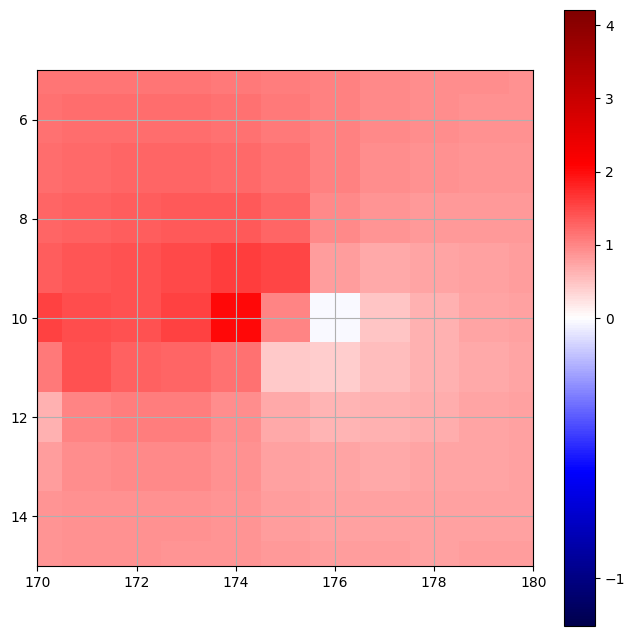

-0.016563041697931494


In [35]:
norm = mcolors.TwoSlopeNorm(vmin=min(d.jdet_field.min(), -1), vcenter=0, vmax=d.jdet_field.max())

plt.figure(figsize=(8, 8))
plt.imshow(d.jdet_field, cmap='seismic', norm=norm)
plt.colorbar()
plt.xlim(170, 180)
plt.ylim(5, 15)
plt.gca().invert_yaxis()
plt.gca().set_aspect('equal', adjustable='box')
plt.grid(True)
plt.show()

print(d.jdet_field[10, 176])

### End

In [ ]:
grid_size = 37

# Keep track of statistics
num_correspondences_removed = 0
negative_counts = [d.count_negatives()]

# Show the initial data object
print("Data object created.")
d.show(show_text=False)
print("Number of negative Jacobian determinants:", d.count_negatives())

while d.count_negatives() > 0:
    start_time = time.time()
    print("\nIteration", num_correspondences_removed + 1)
    
    # Build conflict graph and remove the correspondence with the maximum degree (if any)
    print("Building conflict graph...")
    g, scores = d.build_conflict_graph(grid_size=grid_size, show=False, show_text=False, show_axis=False)
    print("Node scores:", scores)
    show_graph(g)
    idx, _ = get_max_degree(g, scores)
    print("Max degree candidates:", idx)

    # Remove the correspondence with the maximum degree
    print("Removing", idx)
    d = d.remove(idx, show=False)
    
    # Keep track of statistics
    num_negatives = d.count_negatives()
    negative_counts.append(num_negatives)
    print("Number of negative Jacobian determinants:", num_negatives)
    num_correspondences_removed += 1
    print("Time taken:", time.time() - start_time)
    
print("Number of correspondences removed:", num_correspondences_removed)

### Parallelize

Future plans

Three main goals for Laplacian

* Prove that our method can solve the problem

* Show that it doesn’t overdo the solution (avoiding false positives)

* Justify benefits of method
  * Parallelizable


Rest of quarter:

* Test our method on more slices

* Compute accuracy (true positives, true negatives, false positives, false negatives, precision/recall) over correspondence pixel prediction when using lookup table.

* Quantify that the real Jacobians are a subset of the compared pairwise Jacobians.

* Parallelize method and compare efficiency

* Currently, our parameters are threshold ≤ 0 and neighborhood size. 

  * What is the size of the correspondence field size such that it can influence negative Jacobian? How do we pick the neighborhood size from there? 

* Run experiments to determine neighborhood size automatically, based on the range of influence between pairs of correspondences

* Experiment with different ways to resolve negative Jacobian

  * Currently, we remove the negative Jacobian correspondences.

  * Test methods regarding “binning” bad sets of correspondences and iteratively running on these. Or replacing them with some sort of “average” based on neighbors’ properties

Tuesday: finish implementation

Following week: doing literature survey relating to Jacobians, negative Jacobian, Laplacian


3. Laplacian 

What is the size of the correspondence field size such that it can influence negative Jacobian? How do we pick the neighborhood size from there? 
Prediction: pattern matching with LUT values 
Prove this is a valid approach. 
Validity of lookup table. How do we prove that lookup table predicts negative and positive Jacobians correctly? 
Get a % accuracy rate on real data. Run comparison on real data and see how accurate the LUT is for all pairs. 

First, identify the negative Jacobian points


Next, how do we resolve negative Jacobian?
* Bin it 
* Remove it 
* Compute average

Prove that 
1. it solves the problem
2. It doesn't overdo things (false positives)
3. Why is it better? t does it efficiently. There is no other approach that can do it more efficiently than this. 
Advantages: highly parallelizable. 
Pick every two pairs of correspondence, send it to comparison machine, and it will tell you which ones are negative and which ones are positive.

Graduation plan: 
Send current list of publications and accepted / pending 
Future plan for next two three weeks that will result in a publication. 